In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
def filter_data(data):
    Ca_data = np.array(data.iloc[:, :300])
    index = []
    for i in range(len(Ca_data)):
        first_diff = np.diff(Ca_data[i], n=1)[200:]
        second_diff = np.diff(Ca_data[i], n=2)[200:]
        third_diff = np.diff(Ca_data[i], n=3)[200:]
        if np.mean(first_diff) < 1e-5:
            if np.mean(second_diff) < 1e-5:
                if np.mean(third_diff) < 1e-5:
                    index.append(i)
    index = np.array(index)
    filt_data = data.drop(index)
    return filt_data

In [3]:
def normalisation(k_Ca):
    min_Ca = np.min(k_Ca)
    max_Ca = np.max(k_Ca)
    return (k_Ca - min_Ca) / (max_Ca - min_Ca)

In [4]:
def lirinzel_ns(v2, a2, IP3, d5, k3):
    c0, c1 = 2, 0.185
    v1, v3 = 6, 0.9
    d1, d2, d3, Nd = 0.13, 1.049, 0.9434, 2
    time = np.arange(0, 300, 0.1)
    dt = 0.1
    Ca, h = [0.1], [0.1]  # Initialize lists

    # ODE solving
    for _ in range(1, len(time)):  # Start from index 1 to avoid index errors
        CaER = (c0 - Ca[-1]) / c1
        pinf = IP3 / (IP3 + d1)
        ninf = Ca[-1] / (Ca[-1] + d5)
        Q2 = d2 * (IP3 + d1) / (IP3 + d3)
        tauh = 1 / (a2 * (Q2 + Ca[-1]))
        hinf = Q2 / (Q2 + Ca[-1])
        alphah = hinf / tauh
        betah = (1 - hinf) / tauh
        dh = alphah * (1 - h[-1]) - betah * h[-1]
        dCa = (c1 * v1 * pinf**3 * ninf**3 * h[-1]**3 * (CaER - Ca[-1]) +
               c1 * v2 * (CaER - Ca[-1]) -
               v3 * Ca[-1]**2 / (Ca[-1]**2 + k3**2))
        
        # Append new values instead of assigning to an index
        Ca.append(Ca[-1] + dCa * dt)
        h.append(h[-1] + dh * dt)

    # Convert to NumPy array for interpolation
    Ca = np.array(Ca)
    Ca_norm = normalisation(Ca)

    return Ca_norm

In [5]:
np.random.seed(7)

size1 = 8
v2 = np.random.uniform(0, 0.15, size1)
a2 = np.random.uniform(0.10, 0.20, size1)
IP3 = np.random.uniform(0.4, 0.6, size1)
d5 = np.random.uniform(0.08, 0.12, size1)
k3 = np.random.uniform(0.07, 0.11, size1)

In [6]:
Ca_matrix = []
v2_matrix = []
a2_matrix = []
IP3_matrix = []
d5_matrix = []
k3_matrix = []

for i in range(size1):
    for j in range(size1):
        for k in range(size1):
            for l in range(size1):
                for n in range(size1):

                    v2_i = v2[i]
                    a2_j = a2[j]
                    IP3_k = IP3[k]
                    d5_l = d5[l]
                    k3_n = k3[n]

                    Ca = lirinzel_ns(v2_i, a2_j, IP3_k, d5_l, k3_n)
                    Ca_matrix.append(Ca)

                    v2_matrix.append(v2_i)
                    a2_matrix.append(a2_j)
                    IP3_matrix.append(IP3_k)
                    d5_matrix.append(d5_l)
                    k3_matrix.append(k3_n)

Ca_matrix = np.array(Ca_matrix)

KeyboardInterrupt: 

In [11]:
t = np.arange(0, 300, 1)
Ca_matrix_new = Ca_matrix[:, ::10]
Ca_matrix_new.shape

(16807, 300)

In [ ]:
df = pd.DataFrame(Ca_matrix_new)
df["v2"] = np.array(v2_matrix)
df["a2"] = np.array(a2_matrix)
df["IP3"] = np.array(IP3_matrix) 
df["d5"] = np.array(d5_matrix)
df["k3"] = np.array(k3_matrix)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,295,296,297,298,299,v2,a2,IP3,d5,k3
0,0.085806,0.000028,0.000288,0.000706,0.001292,0.002051,0.002982,0.004088,0.005369,0.006828,...,0.443608,0.911293,0.985753,0.813882,0.546392,0.09844,0.171915,0.480371,0.09405,0.083610
1,0.085335,0.000028,0.000280,0.000686,0.001255,0.001991,0.002894,0.003966,0.005206,0.006618,...,0.064240,0.080425,0.115618,0.257452,0.738449,0.09844,0.171915,0.480371,0.09405,0.083062
2,0.098262,0.000021,0.000512,0.001320,0.002459,0.003946,0.005790,0.008005,0.010608,0.013625,...,0.034106,0.039074,0.046281,0.054818,0.065132,0.09844,0.171915,0.480371,0.09405,0.096156
3,0.076304,0.000027,0.000154,0.000358,0.000641,0.001005,0.001447,0.001965,0.002556,0.003218,...,0.012102,0.013395,0.014754,0.016183,0.017684,0.09844,0.171915,0.480371,0.09405,0.070881
4,0.081028,0.000030,0.000218,0.000519,0.000941,0.001484,0.002148,0.002931,0.003832,0.004850,...,0.912316,0.682101,0.395560,0.054540,0.009025,0.09844,0.171915,0.480371,0.09405,0.077682


In [ ]:
df.to_excel("simulated_data2.xlsx", index=False)

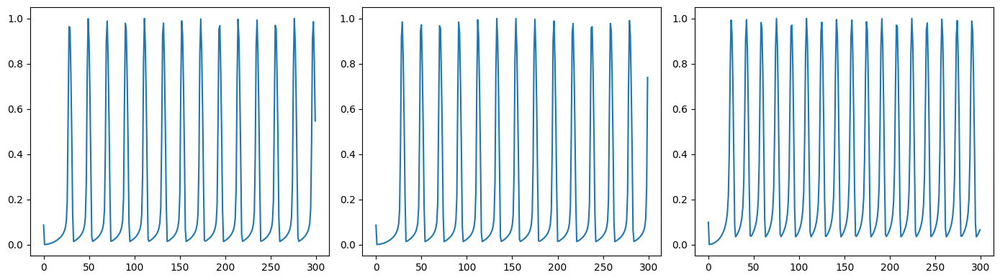

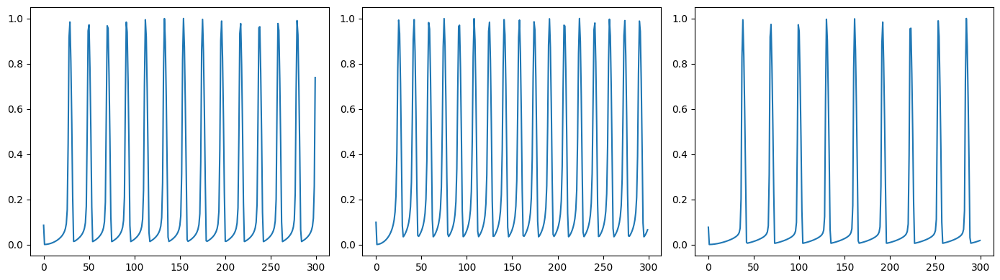

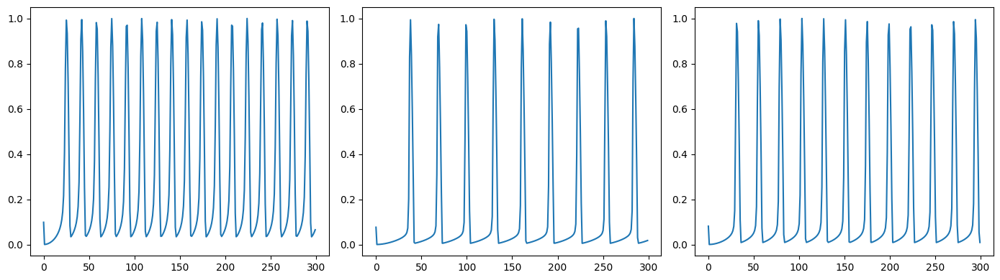

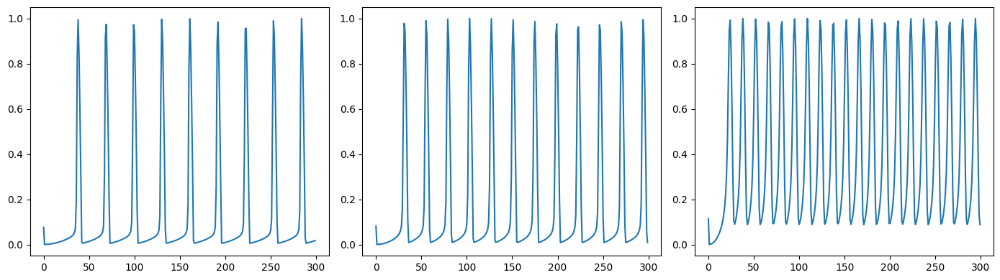

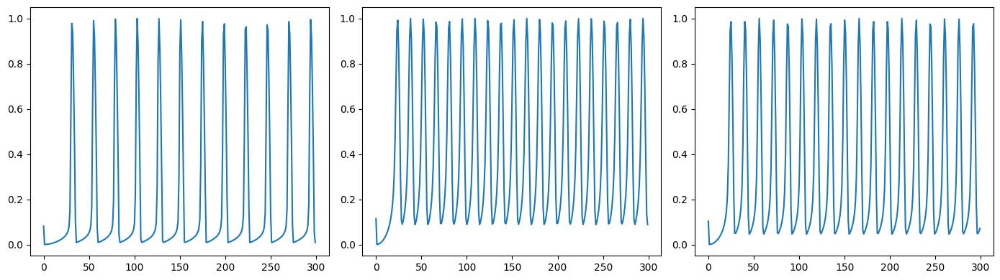

...

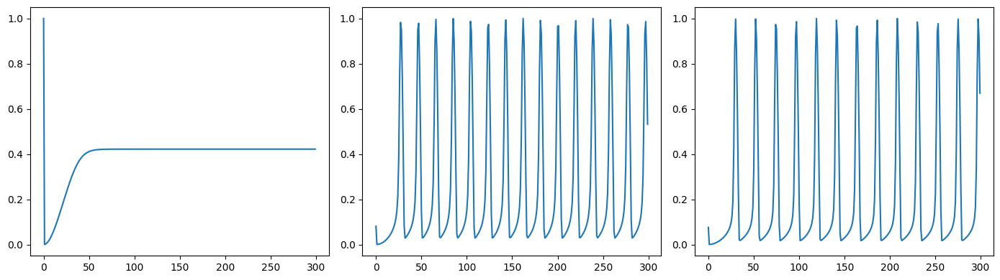

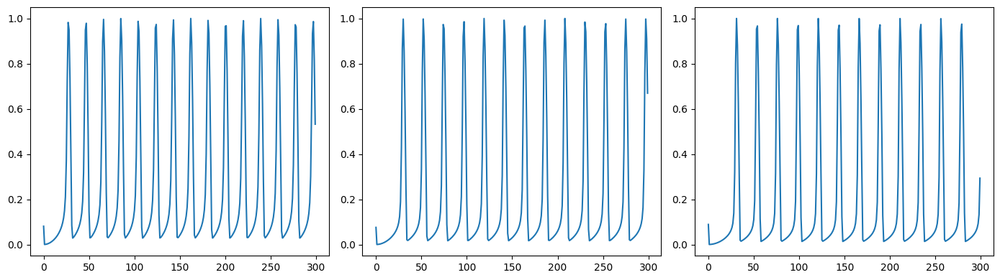

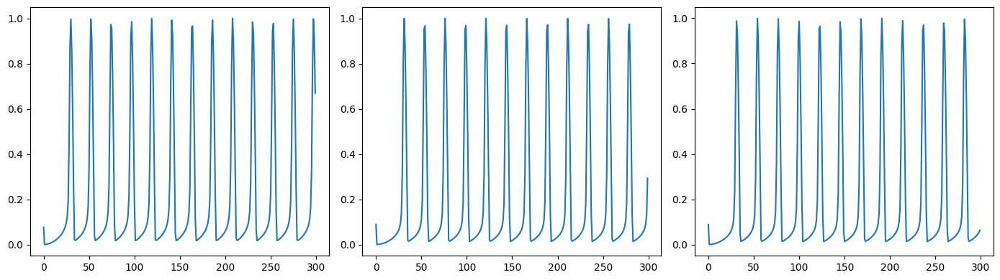

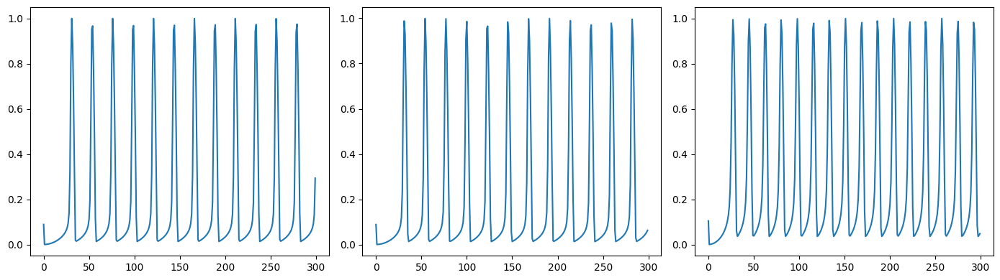

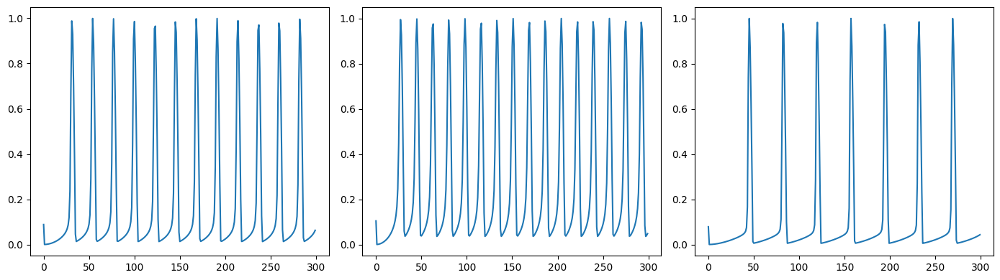

In [12]:
time = np.arange(0, 300, 0.1)
for i in range(100):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    plt.plot(t, Ca_matrix_new[i])
    plt.subplot(132)
    plt.plot(t, Ca_matrix_new[i+1])
    plt.subplot(133)
    plt.plot(t, Ca_matrix_new[i+2])
    plt.tight_layout()
    plt.show()